# Práctica de aprendizaje automático (parte 1)

Entrega este cuaderno habiendo **ejecutado todas las celdas**. Incluye en la entrega **todos los ficheros necesarios para su ejecución**.

Asegúrate de que la presentación está bien estructurada: Se valorará la **claridad, concisión, y completitud** del informe.

Se trata de una práctica abierta: **sé intrépido y explora**. 

1. Describe las características de los datos:
    * Tipo de datos (e.g. [https://archive.ics.uci.edu/ml/datasets/statlog+(german+credit+data)](https://archive.ics.uci.edu/ml/datasets/statlog+(german+credit+data)))
    * Número de ejemplos de cada una de las clases.
    * Número y tipo (nominales no ordenados, nominales ordenados, numéricos) de atributos.

Esta información se debería utilizar en el análisis; por ejemplo, si se selecciona un atributo para la predicción, ¿es clara su relevancia por el tipo de información que proporciona de acuerdo con nuestro conocimiento experto sobre el área?
    
2. Detalla la metodología utilizada:
    * Partición de los datos: tamaño de los conjuntos de entrenamiento y test, uso de estratificación en el muestreo.
    * Preprocesamiento: codificación de los atributos, construcción y selección de características, normalización, etc. (¡solo se debe utilizar la información del conjunto de entrenamiento!)
    * Determinación de los hiperparámetros; por ejemplo, mediante búsqueda en rejilla y validación cruzada.
    * Estimación del error de generalización y su incertidumbre.
2. Resume los resultados en gráficas y tablas.
3. Elabora esta información e ilustra tus observaciones con los resultados obtenidos.
4. Proporciona una recomendación final:
    * Tipo de clasificador.
    * Configuración del clasificador (arquitectura, hiperparámetros, etc.) y método de entrenamiento (función de coste, método de optimización, uso de técnicas de regularización,...)
    * Para el predictor final, proporciona los errores de entrenamiento, validación cruzada y test.
5. Resume las conclusiones del análisis.

## 0. Explora el cuaderno de Python *demo_german_credit_data.ipynb*

## 1. Construcción de clasificadores en bases de datos sintéticas (2 puntos)

In [ ]:
# Fuente:
# http://scikit-learn.org/stable/auto_examples/classification/plot_classifier_comparison.html

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs, make_moons, make_circles
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier

%matplotlib inline

In [3]:
from sklearn.preprocessing import StandardScaler
from matplotlib.colors import ListedColormap

def plot_classifiers(classifiers, datasets):
    
    figure = plt.figure(figsize=(4*6, 4*4))
    h = .02  # step size in the mesh
    i = 1
    # iterate over datasets
    for ds_cnt, ds in enumerate(datasets):
        # preprocess dataset, split into training and test part
        X, y = ds
        X = StandardScaler().fit_transform(X)
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=.4,
                                                            random_state=42)
        x_min, x_max = X[:, 0].min() - .5, X[:, 0].max() + .5
        y_min, y_max = X[:, 1].min() - .5, X[:, 1].max() + .5
        xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                             np.arange(y_min, y_max, h))
        
        # just plot the dataset first
        cm = plt.cm.RdBu
        cm_bright = ListedColormap(['#FF0000', '#0000FF'])
        ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
        if ds_cnt == 0:
            ax.set_title("Input data", fontsize=24)
        # Plot the training points
        ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
                   edgecolors='k')
        # and testing points
        ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright, alpha=0.6,
                   edgecolors='k')
        ax.set_xlim(xx.min(), xx.max())
        ax.set_ylim(yy.min(), yy.max())
        ax.set_xticks(())
        ax.set_yticks(())
        i += 1
        
        # iterate over classifiers
        for name, clf in classifiers:
            ax = plt.subplot(len(datasets), len(classifiers) + 1, i)
            clf.fit(X_train, y_train)
            score = clf.score(X_test, y_test)
            
            # Plot the decision boundary. For that, we will assign a color to each
            # point in the mesh [x_min, x_max]x[y_min, y_max].
            if hasattr(clf, "decision_function"):
                Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
            else:
                Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:, 1]
            
            # Put the result into a color plot
            Z = Z.reshape(xx.shape)
            ax.contourf(xx, yy, Z, cmap=cm, alpha=.8)
            
            # Plot also the training points
            ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=cm_bright,
                       edgecolors='k')
            # and testing points
            ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=cm_bright,
                       edgecolors='k', alpha=0.6)
            
            ax.set_xlim(xx.min(), xx.max())
            ax.set_ylim(yy.min(), yy.max())
            ax.set_xticks(())
            ax.set_yticks(())
            if ds_cnt == 0:
                ax.set_title(name, fontsize=24)
            ax.text(xx.max() - .3, yy.min() + .3, ('Score test: %.2f' % score).lstrip('0'),
                    size=15, horizontalalignment='right')
            i += 1
    
    plt.tight_layout()
    plt.show()

In [4]:
# data preparation
simple = make_blobs(n_samples=500, n_features=2,
                    centers=[[0,0], [2.5,2.5]],
                    random_state=1)
X,y = make_blobs(n_samples=500, n_features=2,
                 centers=[[0,0], [5,1]],
                 random_state=1)
X = X @ np.asarray([[1,-2],[-20,10]])
linearly_separable=(X,y)

datasets = [simple,
            linearly_separable,
            make_moons(noise=0.1, random_state=0, n_samples=500),
            make_circles(noise=0.1, factor=0.5, random_state=1,
                         n_samples=500)
           ]

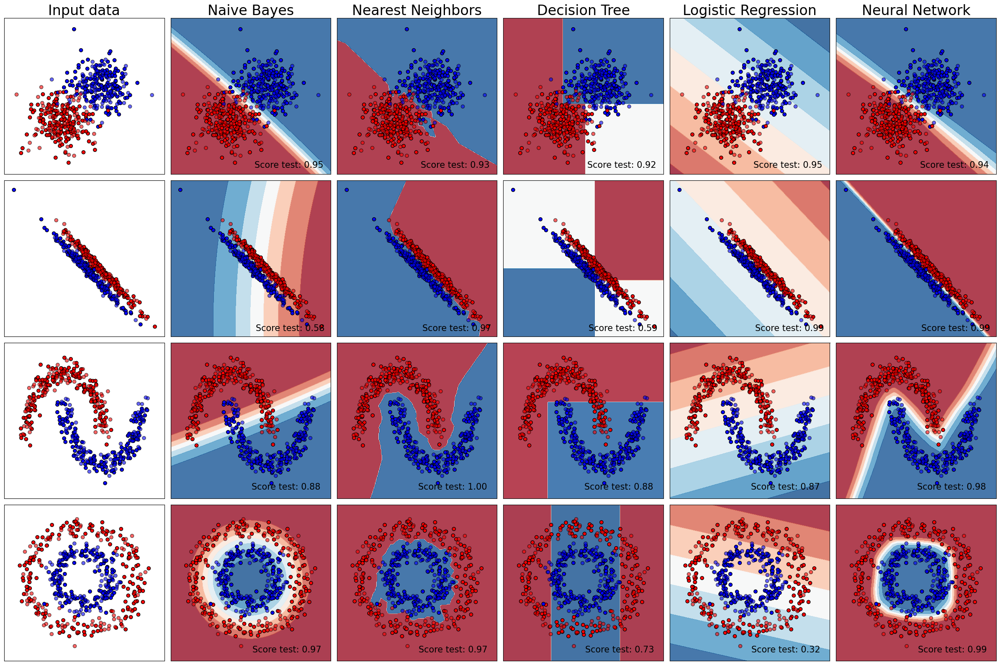

In [5]:
classifiers = [("Naive Bayes", GaussianNB()),
               ("Nearest Neighbors",
                KNeighborsClassifier(n_neighbors=1)), # número de vecinos
               ("Decision Tree",
                DecisionTreeClassifier(criterion='entropy',
                                       max_depth=2)), # profundidad máxima del árbol
               ("Logistic Regression",
                LogisticRegression(C=1.0e10, solver='lbfgs')), 
               # C: cuanto más alto menos regularización 
               ("Neural Network",
                MLPClassifier(hidden_layer_sizes=(50,),
                              max_iter=1000,
                              alpha=0.0))]

plot_classifiers(classifiers, datasets)

In [6]:
# Listado de los parámetros de los diferentes clasificadores
for name, clf in classifiers:
    print(clf)

GaussianNB()
KNeighborsClassifier(n_neighbors=1)
DecisionTreeClassifier(criterion='entropy', max_depth=2)
LogisticRegression(C=10000000000.0)
MLPClassifier(alpha=0.0, hidden_layer_sizes=(50,), max_iter=1000)


**Prueba a cambiar los siguientes parámetros (al menos 3-5 variantes en cada caso) y observa las consecuencias en la frontera de clasificación construida:**

* Número de vecinos en k-nn. 
    * ¿Debería ser impar cuando hay dos clases? Justifica la respuesta.
    * ¿Debería ser impar cuando hay más de dos clases? Justifica la respuesta.
* Profundidad máxima de los árboles de decisión.
* Número de neuronas en la red neuronal y máximo número de épocas de entrenamiento. **Nota:** (50,) indica una única capa oculta con 50 neuronas. (50,10,) indica dos capas ocultas con 50 y 10 neuronas respectivamente. (50,10,20,) indica tres capas ocultas con 50, 10 y 20 neuronas respectivamente, etc.

Número de vecinos = 4

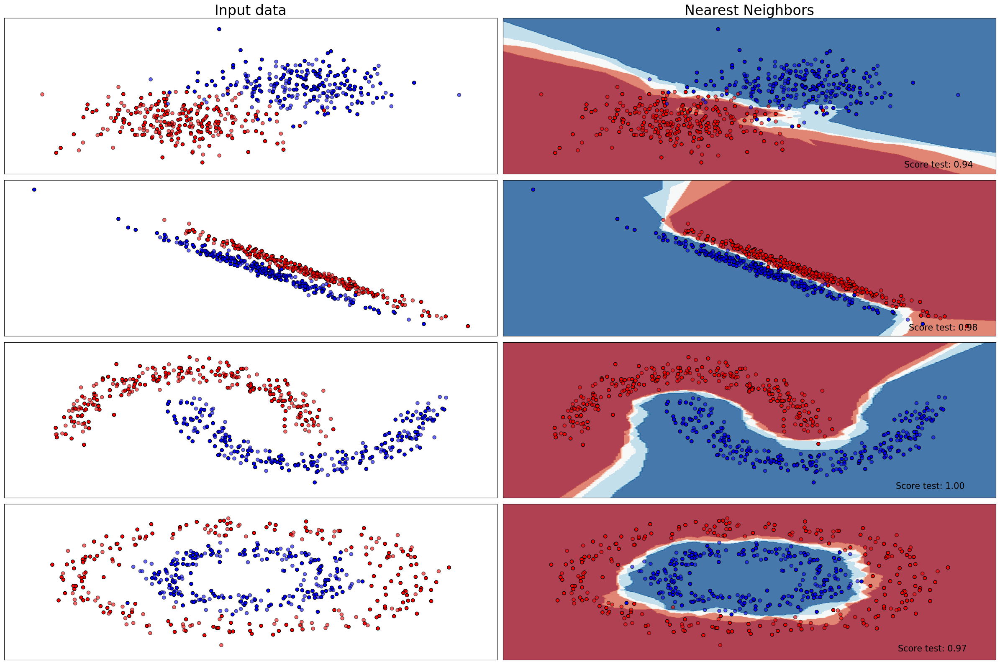

KNeighborsClassifier(n_neighbors=4)


In [13]:

classifiers = [("Nearest Neighbors",
                KNeighborsClassifier(n_neighbors=4))  # número de vecinos
               ]

plot_classifiers(classifiers, datasets)

# Listado de los parámetros de los diferentes clasificadores
for name, clf in classifiers:
    print(clf)

Número de vecinos = 7


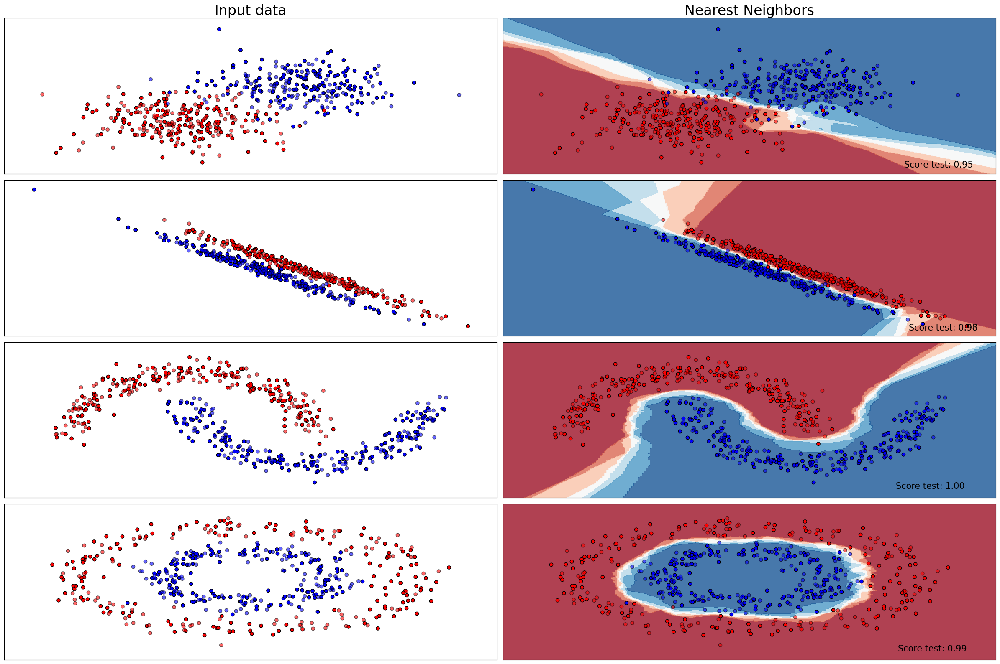

KNeighborsClassifier(n_neighbors=7)


In [11]:

classifiers = [("Nearest Neighbors",
                KNeighborsClassifier(n_neighbors=7))  # número de vecinos
               ]

plot_classifiers(classifiers, datasets)

# Listado de los parámetros de los diferentes clasificadores
for name, clf in classifiers:
    print(clf)

Número de vecinos = 16


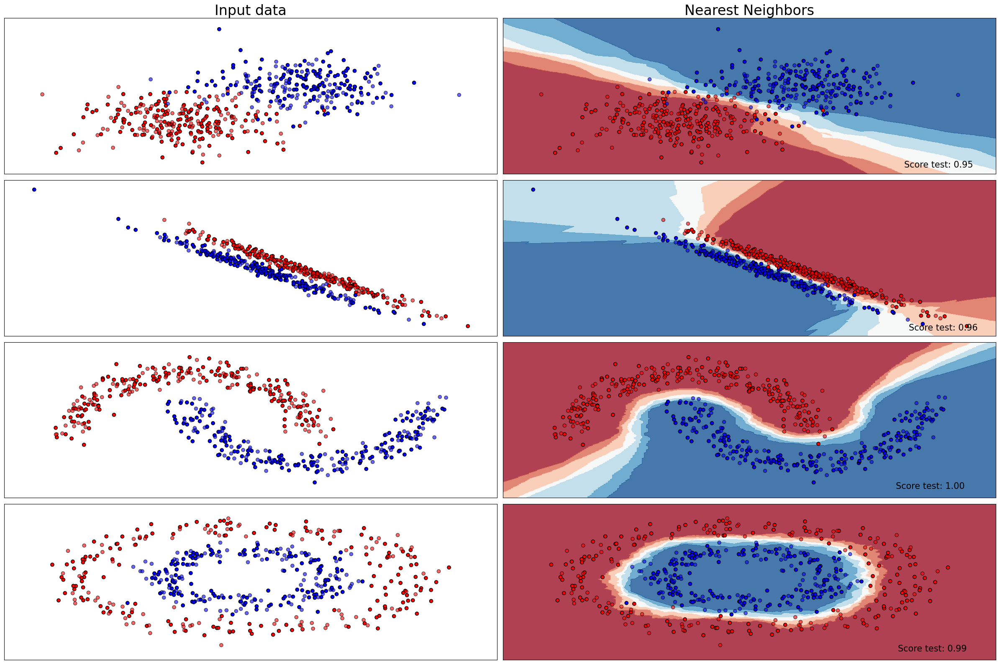

KNeighborsClassifier(n_neighbors=16)


In [12]:

classifiers = [("Nearest Neighbors",
                KNeighborsClassifier(n_neighbors=16))  # número de vecinos
               ]

plot_classifiers(classifiers, datasets)

# Listado de los parámetros de los diferentes clasificadores
for name, clf in classifiers:
    print(clf)

Conclusiones sobre el numero de visitantes.

* ¿Debería ser impar cuando hay dos clases?
    - Sí, cuando tenemos dos clases y utilizamos un número de vecinos par, esto favorece a la aparición de empates, lo que hace que el algoritmo no sea capaz de clasificar algunas zonas. Esto puede verse en los resultados experimentales, donde se aprecia que, a pesar de usar un numero de vecinos menor, el número impar tiende a ser ligeramente más preciso que el número par, sin mencionar que las zonas blancas (indefinidas por el clasificador) son más grandes en las gráficas con número de vecinos par.
* ¿Debería ser impar cuando hay más de dos clases? Justifica la respuesta.
    - Lo mencionado en la pregunta anterior se puede generalizar para cualquier número de clases, si N = número de clases y K = número de vecinos, cuando N es par es preferible que K sea impar para evitar en la mayor medida empates, pero cuando N es impar nos basamos en la regla general (a mayor número de vecinos, mayor precisión)

Prof. Máxima = 4

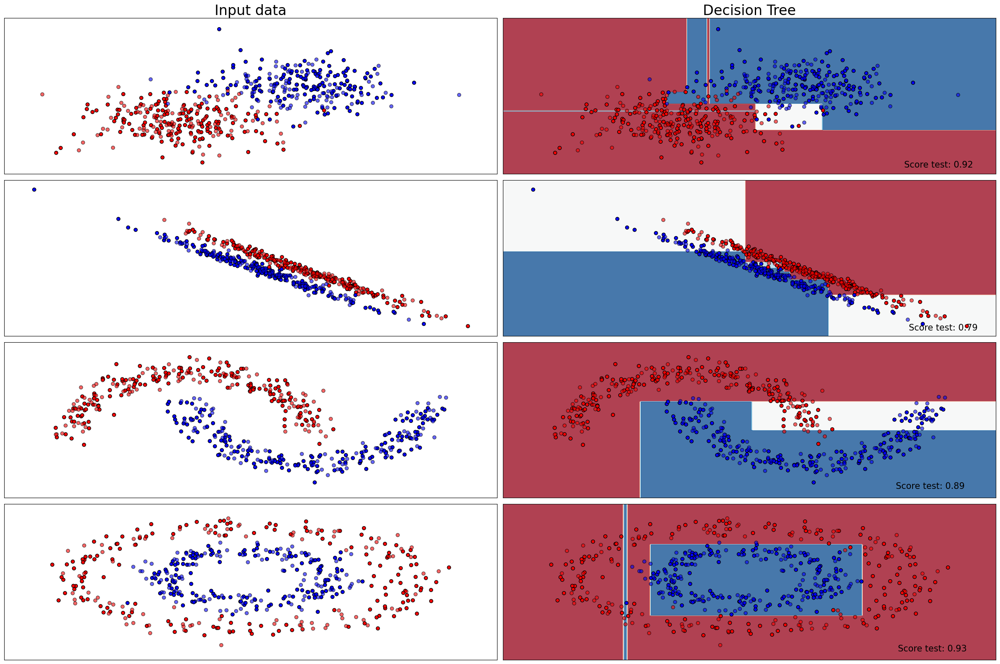

DecisionTreeClassifier(criterion='entropy', max_depth=4)


In [14]:
classifiers = [("Decision Tree",
                DecisionTreeClassifier(criterion='entropy',
                                       max_depth=4))]

plot_classifiers(classifiers, datasets)

for name , clf in classifiers:
    print(clf)

Prof. Máxima = 8

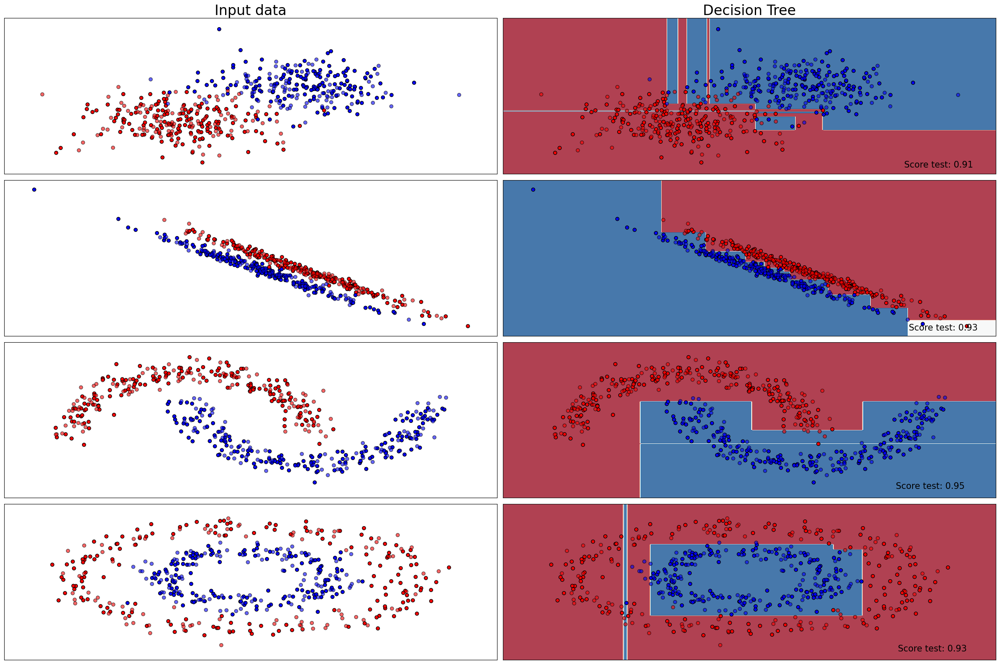

DecisionTreeClassifier(criterion='entropy', max_depth=8)


In [15]:
classifiers = [("Decision Tree",
                DecisionTreeClassifier(criterion='entropy',
                                       max_depth=8))]

plot_classifiers(classifiers, datasets)

for name, clf in classifiers:
    print(clf)

Prof. Máxima = 16

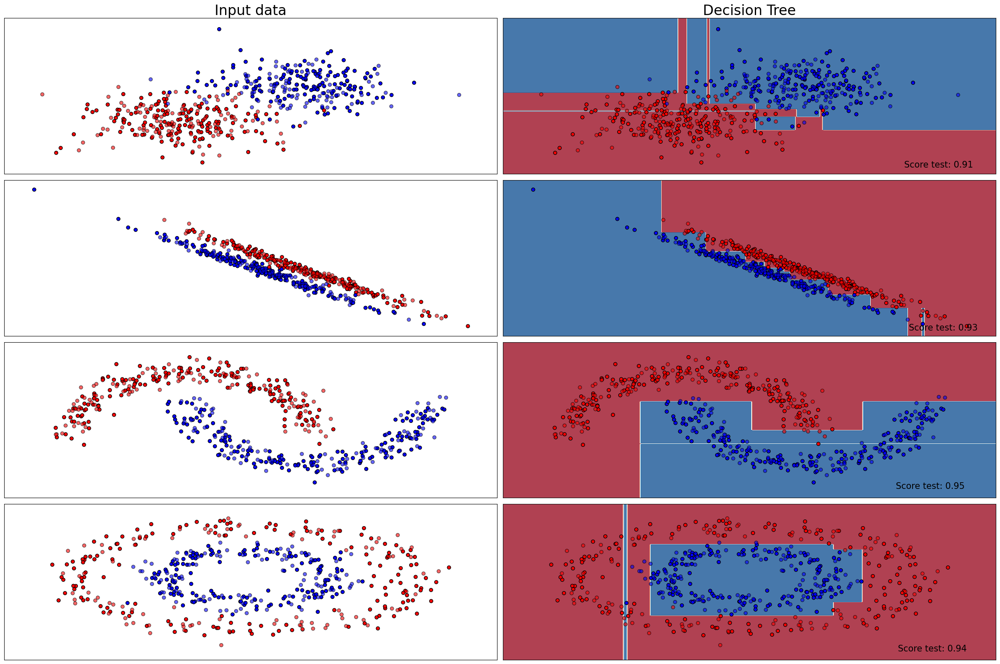

DecisionTreeClassifier(criterion='entropy', max_depth=16)


In [21]:
classifiers = [("Decision Tree",
                DecisionTreeClassifier(criterion='entropy',
                                       max_depth=16))]

plot_classifiers(classifiers, datasets)

for name , clf in classifiers:
    print(clf)

* Profundidad máxima de los árboles de decisión.
    - Vemos que en el caso genral, a medida que aumentamos la profundidad del árbol de decisión también aumenta la precisión. No obstante como vemos en el caso de la primera distribución, a partir de cierto valor esta empieza a caer, efecto conocido como "sobreajuste"

Epocas = 100

/home/capo/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/capo/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/capo/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/capo/anaconda3/lib/python3.11/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


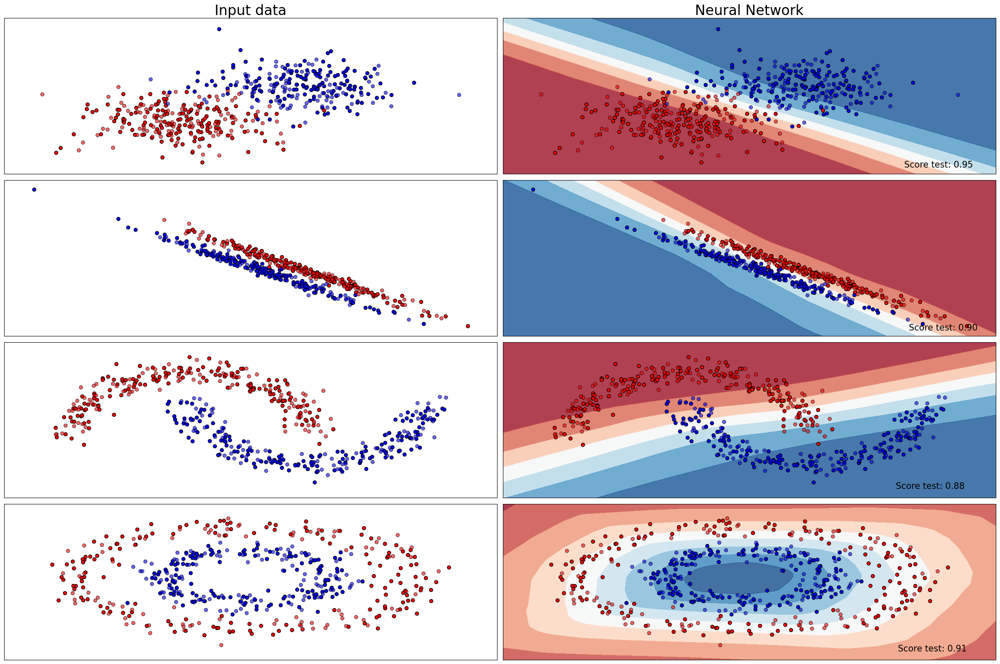

In [23]:
classifiers = [ ("Neural Network",
                MLPClassifier(hidden_layer_sizes=(50,),
                              max_iter=100,
                              alpha=0.0))]

plot_classifiers(classifiers, datasets)

Epocas = 1000 ;
Neuronas = 100, 20,

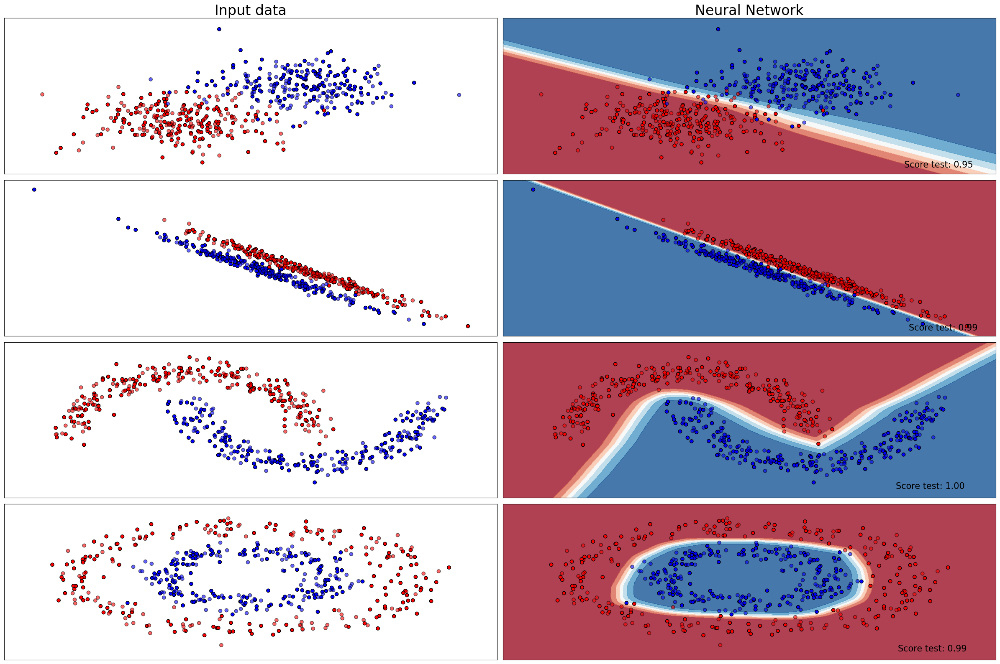

In [27]:
classifiers = [("Neural Network",
                MLPClassifier(hidden_layer_sizes=(100,20,),
                              max_iter=1000,
                              alpha=0.0))]

plot_classifiers(classifiers, datasets)

Épocas = 10000

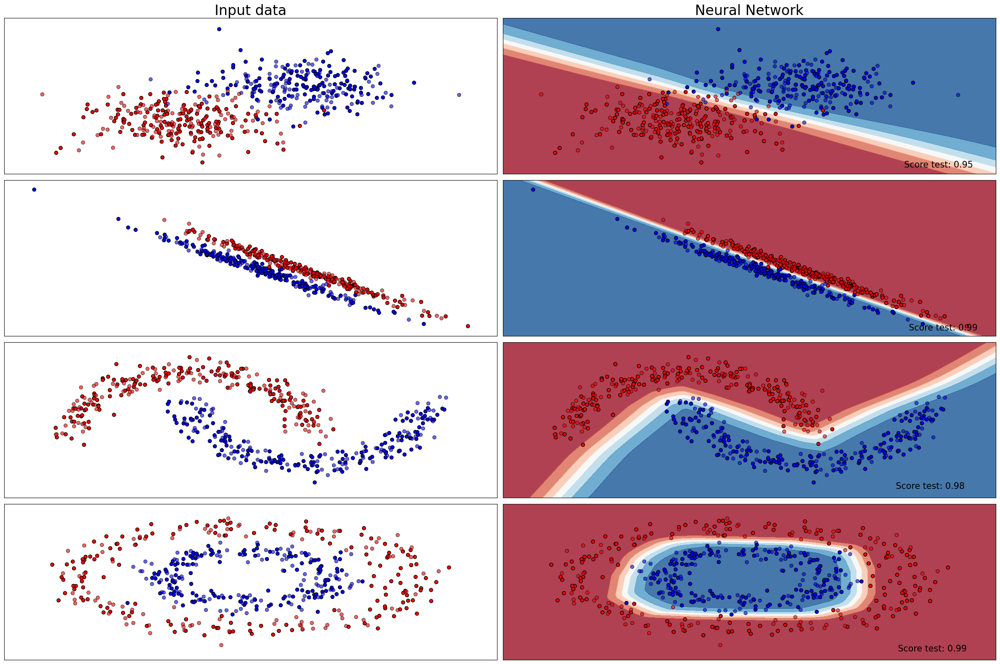

In [33]:
classifiers = [("Neural Network",
                MLPClassifier(hidden_layer_sizes=(50,),
                              max_iter=10000,
                              alpha=0.0))]

plot_classifiers(classifiers, datasets)

* Número de neuronas en la red neuronal y máximo número de épocas de entrenamiento. **Nota:** (50,) indica una única capa oculta con 50 neuronas. (50,10,) indica dos capas ocultas con 50 y 10 neuronas respectivamente. (50,10,20,) indica tres capas ocultas con 50, 10 y 20 neuronas respectivamente, etc.
    
    - Cuando aumentamos el número de neuronas conseguimos mejorías en la precisión a costa de tiempo de computación, por lo cual dependiendo del dataset puede ser útil o no (en este caso vemos que no conseguimos ninguna mejoría destacable)
    - Respecto a el número de épocas, como vemos en el primer ejemplo, si lo reducimos mucho el optimizador no llega a una convergencia (no hay suficiente entrenamiento). Como era de esperarse por otra parte, aumentar el número de épocas conlleva a un aumento en la precisión, aunque no tan pronunciado como aumentar el número de neuronas.

    - También cabe mencionar que podemos sufrir de sobreajuste con valores muy altos tanto para el número de neuronas como para el número de épocas